# Домашнее задание №5 Чебыкина Артёма

### №1

In [1]:
%config IPCompleter.greedy=True

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
import seaborn as sns
from sklearn.model_selection import train_test_split

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram , linkage

from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import DBSCAN

In [3]:
custom_palette = sns.color_palette("viridis", 4)

In [4]:
DataSet = pd.read_csv("data/CC GENERAL.csv")

In [5]:
DataSet.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


Уберём колонку с ID пользователей

In [6]:
features = DataSet.drop("CUST_ID" ,axis= 1)

Уберем значения с Nan и отнормируем признаки

In [7]:
features = features.dropna()

In [8]:
features = (features - features.mean()) / features.std()

In [9]:
features.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.744582,-0.370025,-0.429159,-0.359139,-0.354805,-0.468628,-0.820721,-0.686240,-0.717137,-0.681913,-0.479409,-0.517593,-0.962520,-0.543910,-0.305490,-0.537696,0.35516
1,0.764108,0.067675,-0.473181,-0.359139,-0.458812,2.568408,-1.236067,-0.686240,-0.926468,0.556990,0.099252,-0.597020,0.677165,0.796806,0.087684,0.212368,0.35516
2,0.426578,0.505375,-0.116406,0.099904,-0.458812,-0.468628,1.256004,2.646498,-0.926468,-0.681913,-0.479409,-0.120460,0.813805,-0.399480,-0.099900,-0.537696,0.35516
4,-0.373889,0.505375,-0.465798,-0.349640,-0.458812,-0.468628,-1.028396,-0.408513,-0.926468,-0.681913,-0.479409,-0.557306,-0.907864,-0.380143,-0.261115,-0.537696,0.35516
5,0.099545,0.505375,0.142054,-0.359139,0.994757,-0.468628,0.425314,-0.686240,0.538851,-0.681913,-0.479409,-0.279313,-0.743895,-0.132112,0.650326,-0.537696,0.35516


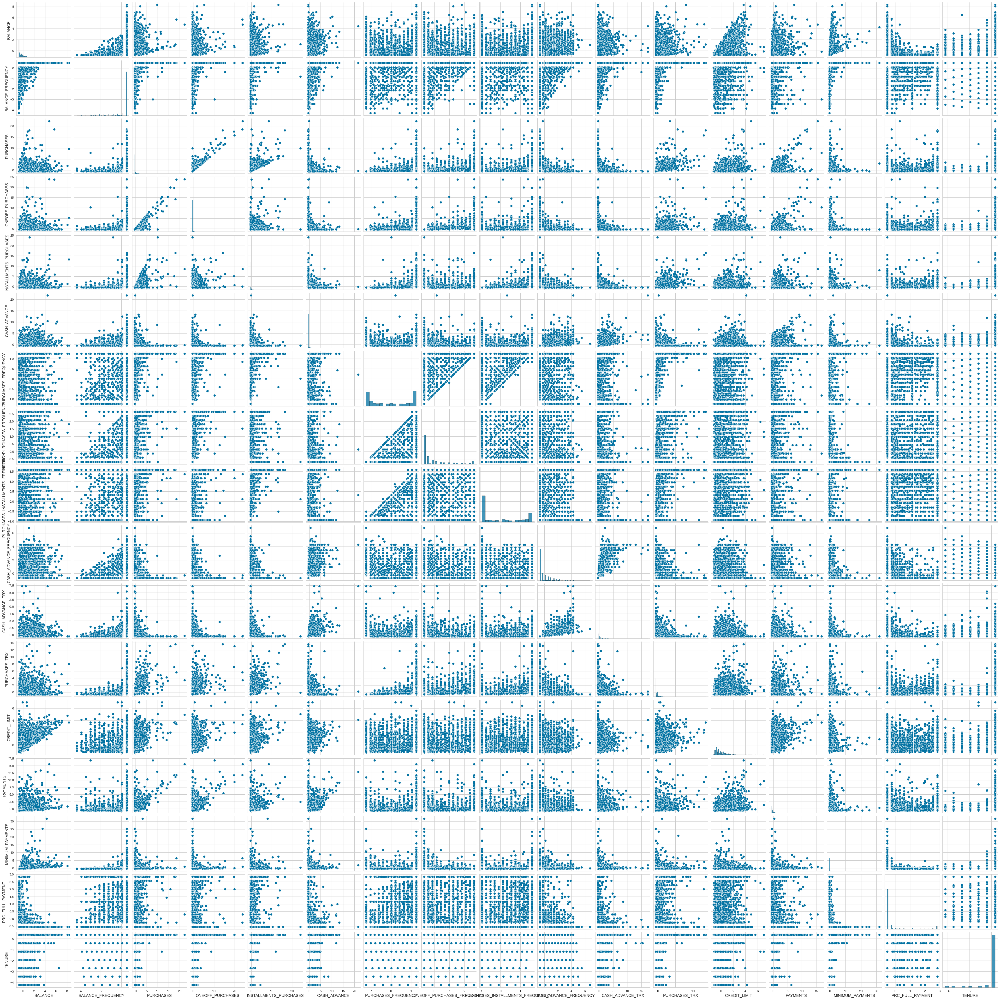

In [10]:
sns.pairplot(features)

In [11]:
hypothesis_features = features[['PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY','PURCHASES_INSTALLMENTS_FREQUENCY','CASH_ADVANCE_FREQUENCY','CREDIT_LIMIT','PRC_FULL_PAYMENT']]

Посмотрим внимательнее на признаки, которые выглядят наиболее интересно распределенными:

PURCHASES_FREQUENCY, ONEOFF_PURCHASES_FREQUENCY, PURCHASES_INSTALLMENTS_FREQUENCY, CASH_ADVANCE_FREQUENCY, CREDIT_LIMIT, PRC_FULL_PAYMENT

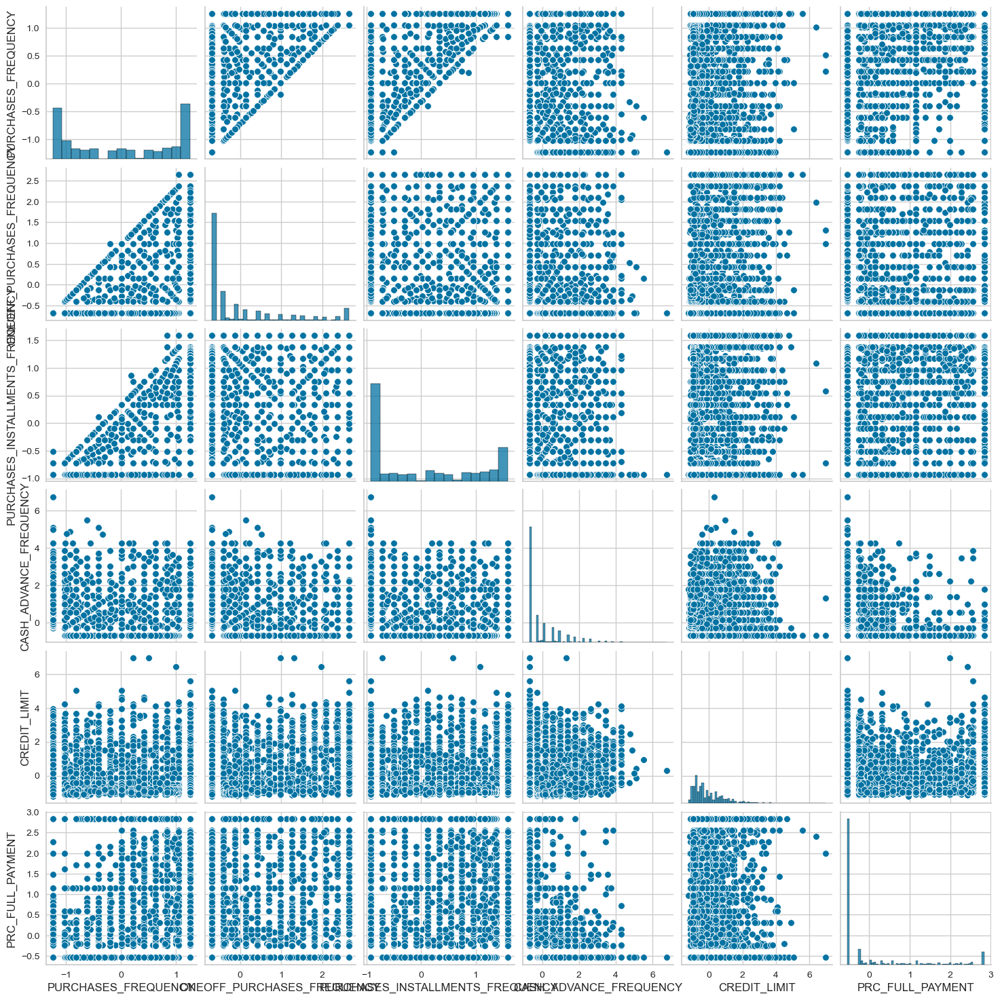

In [12]:
sns.pairplot(hypothesis_features)

По 4 и 5 признакам кажется, что никаких кластеров среди них нет, поэтому будем рассматривать лишь оставшиеся 4

In [13]:
X = features[['PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY','PURCHASES_INSTALLMENTS_FREQUENCY','PRC_FULL_PAYMENT']]

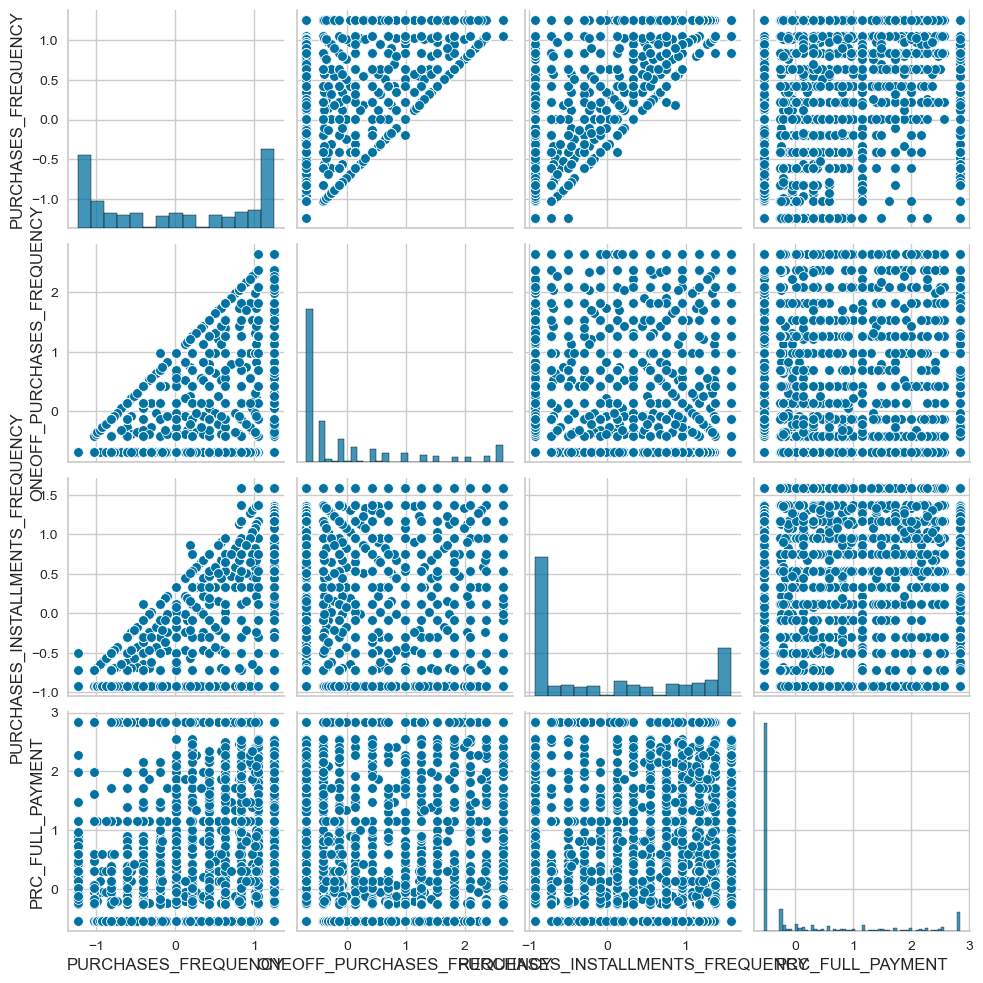

In [14]:
sns.pairplot(X)

По большинству графиков кажется, что кластеров должно быть 2, но возможно это обманчивое чувство, посмотрим на то, как выглядят данные при разделении на 2 кластера

Разделим данные

In [15]:
train,test = train_test_split(X, train_size=0.8)

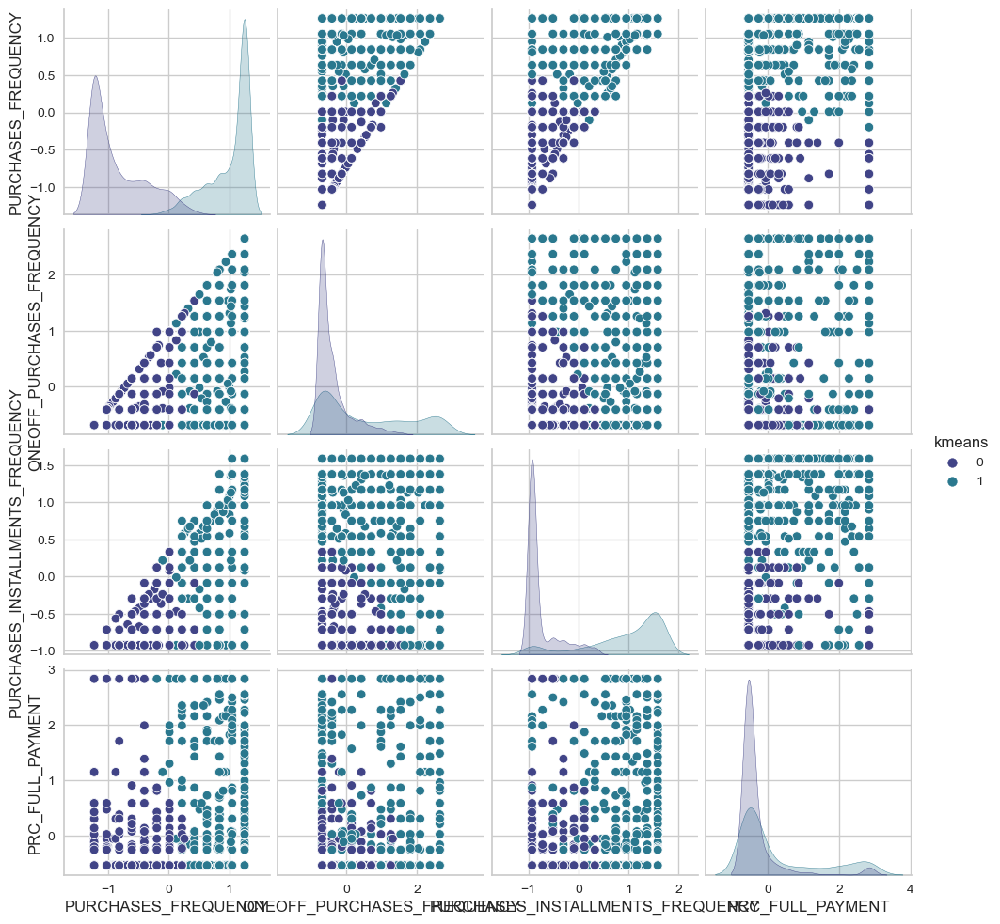

In [16]:
model = KMeans(n_clusters=2, n_init='auto')
model.fit(train)
model_labels = model.predict(test)
test["kmeans"] = model_labels
sns.pairplot(test,hue="kmeans",palette=custom_palette[:2])

Интерпретировать 2 кластера можно достаточно несложно: Люди которые часто совершают те или иные типы покупок и те, кто совершают их редко. При этом по другим параметрам никаких особенных тенденций не прослеживается

### №2

Проверим оптимальное число кластеров с помощью Elbow Method

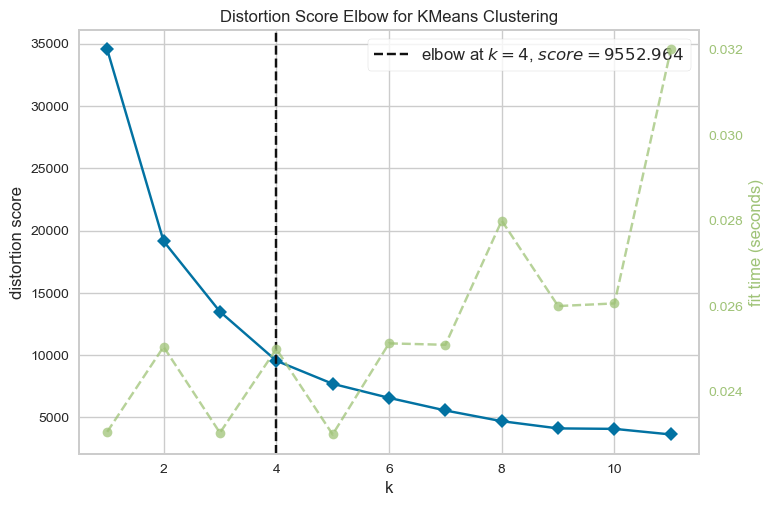

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [17]:
cluster_model = KMeans(n_init='auto')
visualizer = KElbowVisualizer(cluster_model, k=(1,12))

visualizer.fit(X)
visualizer.show()  

Посмотрим на кластеризацию с таким числом параметров

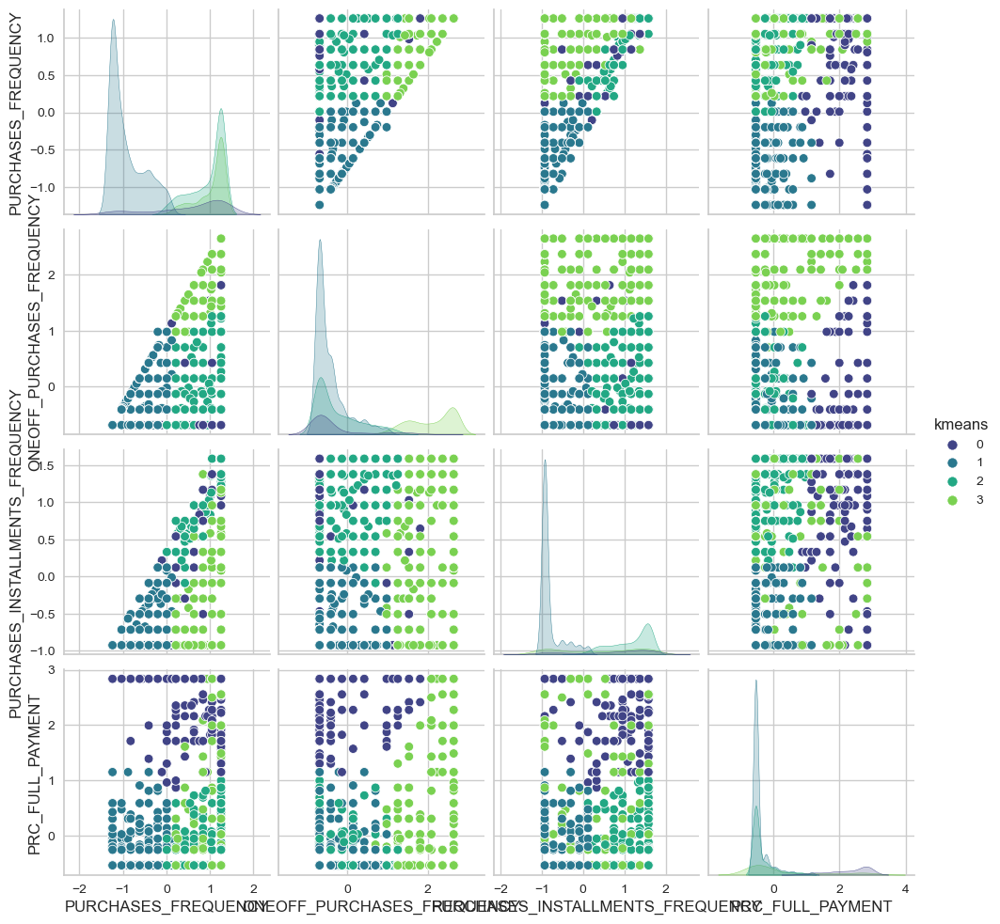

In [18]:
fresh_test = test.drop('kmeans',axis=1)
model = KMeans(n_clusters=4, n_init='auto')
model.fit(train)
model_labels = model.predict(fresh_test)
fresh_test["kmeans"] = model_labels
sns.pairplot(fresh_test,hue="kmeans",palette=custom_palette)

По смыслу 4 кластера должны интерпретироваться как: клиенты часто/редко совершают покупки в рассрочку/сразу(2,3 колонки), а также кластеры показывают типы людей в зависимости от частоты покупок и от процента из них, в которых оплата проихводилась сразу(Например покупают частро в расрочку, часто сразу, редко сразу или редко и в рассрочку). 

В работе модели некоторые кластеры не очень точно определены. Кажется, что некоторые из них находятся поверх друг друга, что намекает на то, что это должен быть один кластер. Некоторые из изображенных кластеров практически сливаются один с другим. При этом другие кластеры достаточно хорошо выделены

Построим модель Иерархической кластеризации

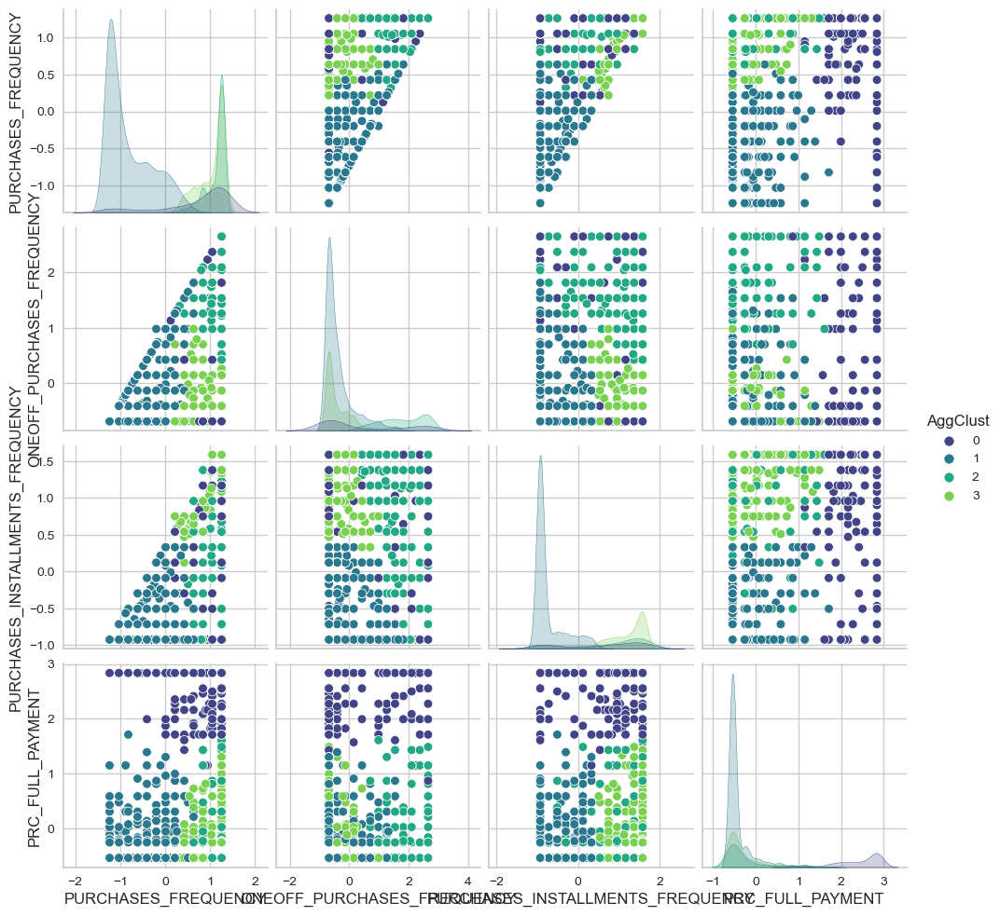

In [19]:
fresh_test = test.drop('kmeans',axis=1)
model = AgglomerativeClustering(4)
agg_result = model.fit_predict(fresh_test)
fresh_test["AggClust"] = agg_result
sns.pairplot(fresh_test,hue="AggClust",palette=custom_palette)

Данная модель отработала хуже, на ней кластеры еще больше слились друг с другом. Большого смысла строить дендрограмму как будто бы нет, ибо шаги кластеризации нам не нужны

Обучим модель DBSCAN

In [20]:
fresh_test = test.drop('kmeans',axis=1)
for e in np.linspace(0.001,3,100):
    for samples_num in range(2,20):
        labels = DBSCAN(eps=e,min_samples=samples_num).fit_predict(fresh_test)
        cluster_cnt = pd.Series(labels).nunique()
        if cluster_cnt == 5 or cluster_cnt == 3:
            print(e,samples_num, cluster_cnt)

0.36451515151515157 10 5
0.36451515151515157 11 5
0.36451515151515157 13 5
0.36451515151515157 17 5
0.36451515151515157 19 5
0.39480808080808083 9 5
0.39480808080808083 11 5
0.39480808080808083 12 5
0.39480808080808083 13 5
0.39480808080808083 14 5
0.39480808080808083 15 5
0.39480808080808083 16 5
0.39480808080808083 17 5
0.39480808080808083 19 5
0.42510101010101015 9 5
0.42510101010101015 11 5
0.42510101010101015 12 5
0.42510101010101015 13 5
0.42510101010101015 14 5
0.42510101010101015 15 5
0.42510101010101015 16 5
0.42510101010101015 17 5
0.4553939393939394 14 5
0.4553939393939394 15 5
0.4553939393939394 16 5
0.4553939393939394 17 5
0.4553939393939394 18 5
0.4553939393939394 19 5
0.4856868686868687 16 5
0.4856868686868687 17 5
0.4856868686868687 18 5
0.4856868686868687 19 5
0.515979797979798 7 5
0.515979797979798 8 5
0.515979797979798 9 5
0.515979797979798 18 3
0.5462727272727274 7 5
0.5462727272727274 9 5
0.5462727272727274 18 3
0.5462727272727274 19 3
0.5765656565656566 5 5
0.5765

Разобьем данные на 4 кластера

In [21]:
dbscan_palette = sns.color_palette("viridis", 5)

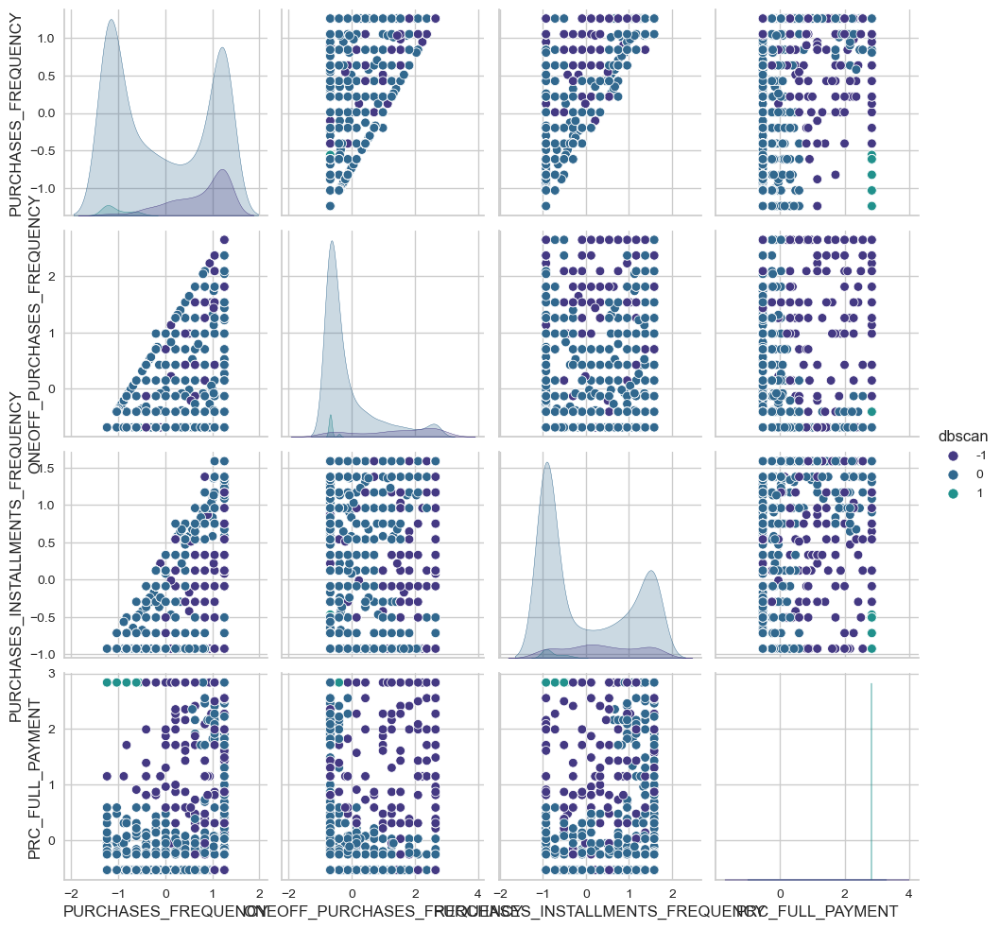

In [31]:
model = DBSCAN(eps=0.5462727272727274,min_samples=18)
dbscan_result = model.fit_predict(fresh_test)
fresh_test["dbscan"] = dbscan_result
sns.pairplot(fresh_test,hue="dbscan",palette=dbscan_palette[:3])

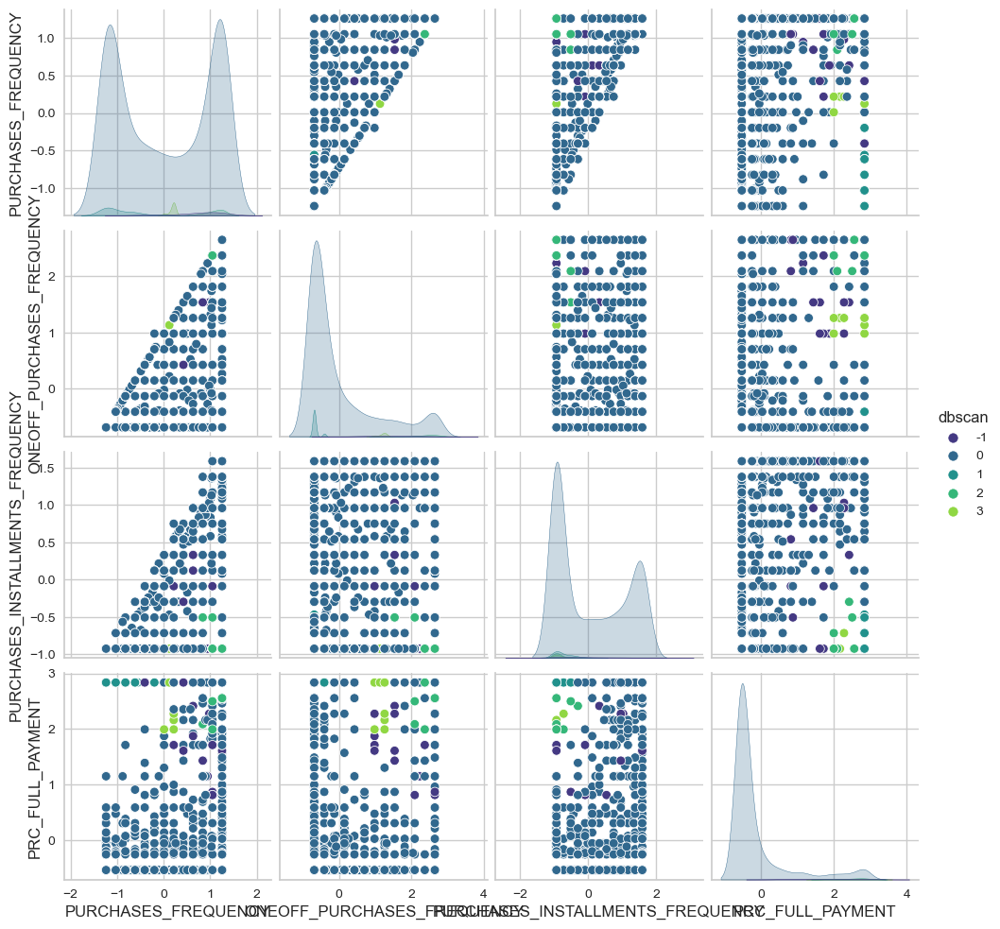

In [32]:
fresh_test = fresh_test.drop('dbscan',axis=1)
model = DBSCAN(eps=0.7583232323232324,min_samples=10)
dbscan_result = model.fit_predict(fresh_test)
fresh_test["dbscan"] = dbscan_result
sns.pairplot(fresh_test,hue="dbscan",palette=dbscan_palette)

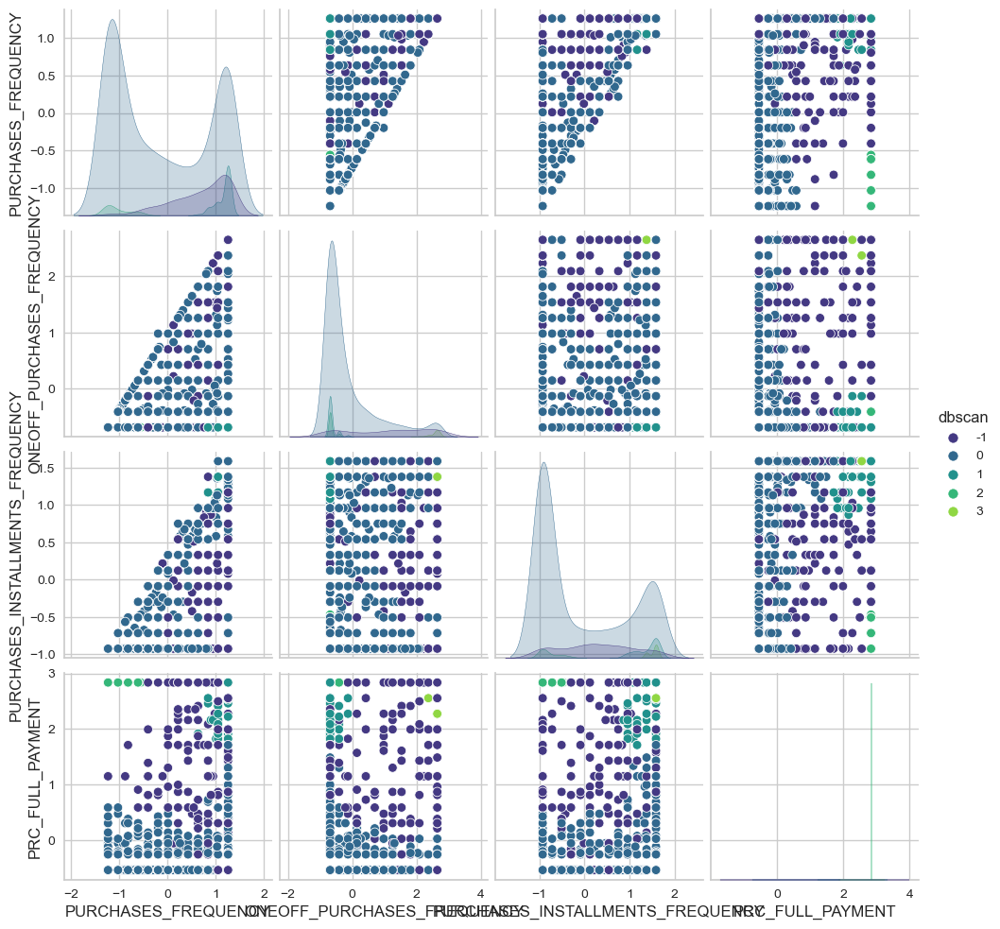

In [33]:
fresh_test = fresh_test.drop('dbscan',axis=1)
model = DBSCAN(eps=0.4856868686868687,min_samples=17)
dbscan_result = model.fit_predict(fresh_test)
fresh_test["dbscan"] = dbscan_result
sns.pairplot(fresh_test,hue="dbscan",palette=dbscan_palette)

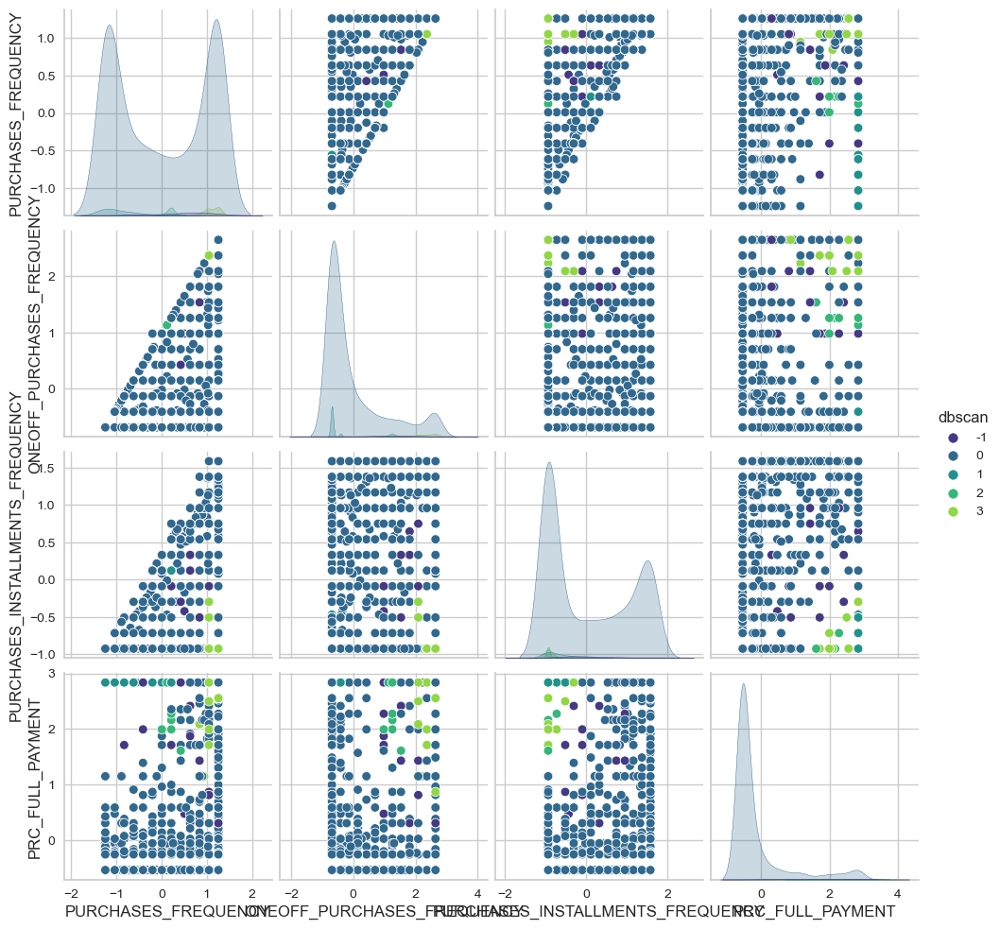

In [34]:
fresh_test = fresh_test.drop('dbscan',axis=1)
model = DBSCAN(eps=0.6068585858585859,min_samples=4)
dbscan_result = model.fit_predict(fresh_test)
fresh_test["dbscan"] = dbscan_result
sns.pairplot(fresh_test,hue="dbscan",palette=dbscan_palette)

Я проверил много достаточно разных комбинаций параметров dbscan, но почти все из них очень плохо кластеризировали наши данные. Без определенной метрики я не очень понимаю как можно осуществить подбор данных параметров.

Итого: у меня лучше всего с задачей справилась модель KMeans с 4 кластерами, но это может быть связано с проблемой подбора параметров для DBSCAN. Объяснения кластеров такие же, как довались выше:



По смыслу 4 кластера должны интерпретироваться как: клиенты часто/редко совершают покупки в рассрочку/сразу(2,3 колонки), а также кластеры показывают типы людей в зависимости от частоты покупок и от процента из них, в которых оплата проихводилась сразу(Например покупают частро в расрочку, часто сразу, редко сразу или редко и в рассрочку). 